# Section 1: Notebook Setup & Imports

This section initializes the environment, sets up path resolution, imports libraries for modeling and evaluation, and configures the random seed for reproducibility. We also verify CUDA availability for XGBoost.

In [1]:
import os
import sys
import random
import time
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, root_mean_squared_error
import torch
import xgboost as xgb
from xgboost import XGBRegressor

def find_project_root():
    candidates = [Path.cwd().resolve(), *Path.cwd().resolve().parents]
    for cand in candidates:
        if (cand / "data").exists() and (cand / "d_models").exists():
            return cand
    raise FileNotFoundError("Could not locate repo root containing 'data'")

PROJECT_ROOT = find_project_root()
print(f"Project root found: {PROJECT_ROOT}")

# Append project root to sys.path
sys_path_root = str(PROJECT_ROOT)
if sys_path_root not in sys.path:
    sys.path.append(sys_path_root)

# Define out_dir globally for 1.2 hyperparameter sweep
out_dir = PROJECT_ROOT / "notebooks/experiment/derived_8.2-hyperparameters-1.2"
out_dir.mkdir(parents=True, exist_ok=True)
print(f"Output directory: {out_dir}")

import warnings
warnings.filterwarnings("ignore")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)
print(f"Random seed set to {SEED}")

# Setup plotting style
plt.style.use("default")
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams["axes.grid"] = True

# Verify CUDA/GPU availability for XGBoost
try:
    dummy = xgb.XGBRegressor(n_estimators=1, device="cuda")
    dummy.fit(np.array([[1.0]]), np.array([1.0]))
    XGB_DEVICE = "cuda"
    print("XGBoost CUDA support verified and enabled.")
except Exception as e:
    XGB_DEVICE = "cpu"
    print(f"XGBoost CUDA test failed ({e}). Falling back to CPU.")

print("Setup complete. Using device:", XGB_DEVICE)


Project root found: C:\Users\pan\Documents\GitHub\MDR-Project
Output directory: C:\Users\pan\Documents\GitHub\MDR-Project\notebooks\experiment\derived_8.2-hyperparameters-1.2
Random seed set to 42


XGBoost CUDA support verified and enabled.
Setup complete. Using device: cuda


# Section 2: Data Loading & Preprocessing

This section loads the train, validation, and test splits for the Washington-only `derived_8.2` dataset. We concatenate the train and validation sets to form the `trainval` split for model training, parse dates, and extract month and year features.

In [2]:
# Define path configurations
TRAIN_PATH = PROJECT_ROOT / "data/splits/derived_8.2/train.csv"
VAL_PATH = PROJECT_ROOT / "data/splits/derived_8.2/val.csv"
TEST_PATH = PROJECT_ROOT / "data/splits/derived_8.2/test.csv"

# Load dataset splits
train_df = pd.read_csv(TRAIN_PATH)
val_df = pd.read_csv(VAL_PATH)
test_df = pd.read_csv(TEST_PATH)

print("Dataset splits loaded:")
print(f"  train: {train_df.shape}")
print(f"  val:   {val_df.shape}")
print(f"  test:  {test_df.shape}")

# Parse date, extract month and year
for df in [train_df, val_df, test_df]:
    df["date"] = pd.to_datetime(df["date"])
    df["month"] = df["date"].dt.month.astype(int)
    df["year"] = df["date"].dt.year.astype(float)

# Concatenate train and val for training+validation
trainval_df = pd.concat([train_df, val_df], axis=0).reset_index(drop=True)
print(f"  trainval (concatenated): {trainval_df.shape}")

Dataset splits loaded:
  train: (15704, 499)
  val:   (7149, 499)
  test:  (8902, 499)
  trainval (concatenated): (22853, 500)


# Section 3: Feature & Hyperparameters Configuration

In this section, we load Feature Set V3 (47 features) from `dataset_metadata.py` and programmatically construct the 80 configurations (2 baselines and 78 new hyperparameter/objective sweeps) designed to combat overfitting.


In [3]:
# Import Feature Sets from dataset_metadata for derived_8.2
import importlib.util
metadata_path = PROJECT_ROOT / "data/splits/derived_8.2/dataset_metadata.py"
spec = importlib.util.spec_from_file_location("dataset_metadata", metadata_path)
dataset_metadata = importlib.util.module_from_spec(spec)
spec.loader.exec_module(dataset_metadata)

FEATURE_SET_V3 = dataset_metadata.OVERALL_SELECTED_FEATURES_V3
TARGET_COL = "soil_moisture_5cm"

print(f"Feature Set V3 count: {len(FEATURE_SET_V3)}")

MODELS_CONFIG = [
    # 0. Baseline MAE
    {"id": 0, "name": "Baseline (MAE)", "objective": "reg:absoluteerror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 1.5, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.04, "n_estimators": 1200},
    # 1. Baseline MSE
    {"id": 1, "name": "Baseline (MSE)", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 1.5, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.04, "n_estimators": 1200},
]

# A: MSE Regularization Grid (27 models, IDs 2-28)
model_id = 2
for lmb in [3.0, 10.0, 30.0]:
    for alp in [0.1, 1.0, 5.0]:
        for mcw in [2, 10, 30]:
            MODELS_CONFIG.append({
                "id": model_id,
                "name": f"MSE Reg d=8 L2={lmb} L1={alp} MCW={mcw}",
                "objective": "reg:squarederror",
                "max_depth": 8,
                "min_child_weight": mcw,
                "reg_lambda": lmb,
                "reg_alpha": alp,
                "subsample": 0.9,
                "colsample_bytree": 0.8,
                "learning_rate": 0.02,
                "n_estimators": 2400
            })
            model_id += 1

# B: MSE Subsampling & Shallow Depths Grid (24 models, IDs 29-52)
for depth in [5, 6]:
    for sub in [0.6, 0.8]:
        for col in [0.4, 0.6]:
            for mcw in [2, 10, 30]:
                MODELS_CONFIG.append({
                    "id": model_id,
                    "name": f"MSE Samp d={depth} sub={sub} col={col} MCW={mcw}",
                    "objective": "reg:squarederror",
                    "max_depth": depth,
                    "min_child_weight": mcw,
                    "reg_lambda": 1.5,
                    "reg_alpha": 0.03,
                    "subsample": sub,
                    "colsample_bytree": col,
                    "learning_rate": 0.02,
                    "n_estimators": 2400
                })
                model_id += 1

# C: Huber Loss & Regularization (18 models, IDs 53-70)
for slope in [1.5, 3.0, 5.0]:
    for depth in [6, 8]:
        for mcw in [2, 10, 30]:
            MODELS_CONFIG.append({
                "id": model_id,
                "name": f"Huber Slope {slope} d={depth} MCW={mcw}",
                "objective": "reg:pseudohubererror",
                "huber_slope": slope,
                "max_depth": depth,
                "min_child_weight": mcw,
                "reg_lambda": 5.0,
                "reg_alpha": 0.5,
                "subsample": 0.9,
                "colsample_bytree": 0.8,
                "learning_rate": 0.02,
                "n_estimators": 2400
            })
            model_id += 1

# D: Learning Rate 0.01 & Heavy Regularization Sweep (9 models, IDs 71-79)
MODELS_CONFIG.append({
    "id": model_id, "name": "MSE Depth 8 LR 0.01 Heavy L2", "objective": "reg:squarederror", 
    "max_depth": 8, "min_child_weight": 10, "reg_lambda": 30.0, "reg_alpha": 1.0, 
    "subsample": 0.8, "colsample_bytree": 0.6, "learning_rate": 0.01, "n_estimators": 4800
})
model_id += 1
MODELS_CONFIG.append({
    "id": model_id, "name": "MSE Depth 8 LR 0.01 Heavy L1", "objective": "reg:squarederror", 
    "max_depth": 8, "min_child_weight": 10, "reg_lambda": 3.0, "reg_alpha": 5.0, 
    "subsample": 0.8, "colsample_bytree": 0.6, "learning_rate": 0.01, "n_estimators": 4800
})
model_id += 1
MODELS_CONFIG.append({
    "id": model_id, "name": "MSE Depth 6 LR 0.01 Moderate Reg", "objective": "reg:squarederror", 
    "max_depth": 6, "min_child_weight": 10, "reg_lambda": 10.0, "reg_alpha": 1.0, 
    "subsample": 0.8, "colsample_bytree": 0.6, "learning_rate": 0.01, "n_estimators": 4800
})
model_id += 1
MODELS_CONFIG.append({
    "id": model_id, "name": "MSE Depth 6 LR 0.01 Heavy Reg", "objective": "reg:squarederror", 
    "max_depth": 6, "min_child_weight": 30, "reg_lambda": 30.0, "reg_alpha": 5.0, 
    "subsample": 0.8, "colsample_bytree": 0.6, "learning_rate": 0.01, "n_estimators": 4800
})
model_id += 1
MODELS_CONFIG.append({
    "id": model_id, "name": "Huber Depth 8 LR 0.01 slope 3.0 Mod Reg", "objective": "reg:pseudohubererror", 
    "huber_slope": 3.0, "max_depth": 8, "min_child_weight": 10, "reg_lambda": 15.0, "reg_alpha": 0.5, 
    "subsample": 0.8, "colsample_bytree": 0.6, "learning_rate": 0.01, "n_estimators": 4800
})
model_id += 1
MODELS_CONFIG.append({
    "id": model_id, "name": "Huber Depth 8 LR 0.01 slope 3.0 Heavy Reg", "objective": "reg:pseudohubererror", 
    "huber_slope": 3.0, "max_depth": 8, "min_child_weight": 30, "reg_lambda": 30.0, "reg_alpha": 2.0, 
    "subsample": 0.8, "colsample_bytree": 0.6, "learning_rate": 0.01, "n_estimators": 4800
})
model_id += 1
MODELS_CONFIG.append({
    "id": model_id, "name": "Huber Depth 6 LR 0.01 slope 3.0 Mod Reg", "objective": "reg:pseudohubererror", 
    "huber_slope": 3.0, "max_depth": 6, "min_child_weight": 10, "reg_lambda": 15.0, "reg_alpha": 0.5, 
    "subsample": 0.8, "colsample_bytree": 0.6, "learning_rate": 0.01, "n_estimators": 4800
})
model_id += 1
MODELS_CONFIG.append({
    "id": model_id, "name": "Huber Depth 6 LR 0.01 slope 3.0 Heavy Reg", "objective": "reg:pseudohubererror", 
    "huber_slope": 3.0, "max_depth": 6, "min_child_weight": 30, "reg_lambda": 30.0, "reg_alpha": 2.0, 
    "subsample": 0.8, "colsample_bytree": 0.6, "learning_rate": 0.01, "n_estimators": 4800
})
model_id += 1
MODELS_CONFIG.append({
    "id": model_id, "name": "Huber Depth 7 LR 0.01 slope 1.5 Heavy Reg", "objective": "reg:pseudohubererror", 
    "huber_slope": 1.5, "max_depth": 7, "min_child_weight": 20, "reg_lambda": 20.0, "reg_alpha": 1.0, 
    "subsample": 0.8, "colsample_bytree": 0.6, "learning_rate": 0.01, "n_estimators": 4800
})

print(f"Total model configurations configured: {len(MODELS_CONFIG)}")


Feature Set V3 count: 47
Total model configurations configured: 80


# Section 4: Training & Timing Loop

In this section, we define the training routine for all 80 model configurations. For each model:
1. We check if the saved model weights (`xgb_model_{id}.json`) and metadata (`xgb_model_{id}_meta.json`) already exist on disk.
2. If they do, we load the model and retrieve the cached training and inference time performance from the metadata.
3. If they do not, we train the model using GPU acceleration (`device="cuda"`), measure the training and inference time performance using `time.perf_counter()`, and save both the model weights and timing metadata back to disk. We also pass the test split as the evaluation set to record step-by-step training and testing losses.
4. We generate and cache test set predictions and loss curves for each configuration.


In [4]:
y_trainval = np.asarray(trainval_df[TARGET_COL]).ravel()
y_test = np.asarray(test_df[TARGET_COL]).ravel()
X_trainval = trainval_df[FEATURE_SET_V3]
X_test = test_df[FEATURE_SET_V3]

models_dir = out_dir / "models"
models_dir.mkdir(parents=True, exist_ok=True)

# Prepare DataFrame to hold predictions
test_predictions_df = test_df[["date", "year", "month", TARGET_COL]].copy()

# Store execution metrics dynamically
trained_models = {}
evals_results = {}

print("Starting training loop for 80 configurations...\n")
for config in MODELS_CONFIG:
    model_id = config["id"]
    model_name = config["name"]
    
    model_path = models_dir / f"xgb_model_{model_id}.json"
    meta_path = models_dir / f"xgb_model_{model_id}_meta.json"
    
    # Configure parameters dynamically
    params = {
        "objective": config["objective"],
        "random_state": SEED,
        "n_jobs": -1,
        "subsample": config["subsample"],
        "colsample_bytree": config["colsample_bytree"],
        "max_depth": config["max_depth"],
        "min_child_weight": config["min_child_weight"],
        "n_estimators": config["n_estimators"],
        "learning_rate": config["learning_rate"],
        "reg_lambda": config["reg_lambda"],
        "reg_alpha": config["reg_alpha"],
        "device": XGB_DEVICE,
    }
    if "huber_slope" in config:
        params["huber_slope"] = config["huber_slope"]
    if "gamma" in config:
        params["gamma"] = config["gamma"]
        
    model = XGBRegressor()
    
    if model_path.exists() and meta_path.exists():
        print(f"[{model_id}] Loading {model_name} from disk...")
        model.load_model(str(model_path))
        with open(meta_path, "r") as f:
            meta = json.load(f)
        train_time = meta["train_time_s"]
        inference_time = meta["inference_time_s"]
        evals = meta.get("evals_result", {})
        
        # Still predict to populate predictions dataframe
        preds = np.asarray(model.predict(X_test)).ravel()
    else:
        print(f"[{model_id}] Training {model_name} from scratch...")
        model = XGBRegressor(**params)
        
        # Measure training time
        t0 = time.perf_counter()
        model.fit(
            X_trainval, y_trainval,
            eval_set=[(X_trainval, y_trainval), (X_test, y_test)],
            verbose=False
        )
        t1 = time.perf_counter()
        train_time = t1 - t0
        
        # Measure inference time
        t2 = time.perf_counter()
        preds = np.asarray(model.predict(X_test)).ravel()
        t3 = time.perf_counter()
        inference_time = t3 - t2
        
        evals = model.evals_result()
        
        # Save model and meta to disk
        model.save_model(str(model_path))
        meta = {
            "train_time_s": train_time,
            "inference_time_s": inference_time,
            "params": {k: v for k, v in params.items() if k != "device"},
            "evals_result": evals
        }
        with open(meta_path, "w") as f:
            json.dump(meta, f, indent=2)
            
        print(f"  Training time:  {train_time:.2f}s")
        print(f"  Inference time: {inference_time:.4f}s")
        
    test_predictions_df[f"pred_{model_id}"] = preds
    config["train_time_s"] = train_time
    config["inference_time_s"] = inference_time
    trained_models[model_id] = model
    evals_results[model_id] = evals

print("\nAll 80 models processed.")
# Save predictions DataFrame
test_predictions_df.to_csv(out_dir / "test_predictions.csv", index=False)
print(f"Saved test predictions to: {out_dir / 'test_predictions.csv'}")

# Generate and save step-by-step training losses to CSV for each step
max_steps = max(len(evals_results[mid]["validation_0"][list(evals_results[mid]["validation_0"].keys())[0]]) for mid in evals_results)
loss_data = {"step": list(range(max_steps))}
for mid in sorted(evals_results.keys()):
    evals = evals_results[mid]
    metric_key = list(evals["validation_0"].keys())[0]
    train_loss = evals["validation_0"][metric_key]
    val_loss = evals["validation_1"][metric_key]
    
    # Pad to max_steps with NaN for models that finish in fewer boosting rounds
    train_loss_padded = list(train_loss) + [np.nan] * (max_steps - len(train_loss))
    val_loss_padded = list(val_loss) + [np.nan] * (max_steps - len(val_loss))
    
    loss_data[f"train_loss_model_{mid}"] = train_loss_padded
    loss_data[f"val_loss_model_{mid}"] = val_loss_padded

loss_df = pd.DataFrame(loss_data)
loss_df.to_csv(out_dir / "loss_curves.csv", index=False)
print(f"Saved step-by-step training loss history of all 80 models to: {out_dir / 'loss_curves.csv'}")


Starting training loop for 80 configurations...

[0] Training Baseline (MAE) from scratch...


  Training time:  9.68s
  Inference time: 0.0844s
[1] Training Baseline (MSE) from scratch...


  Training time:  8.06s
  Inference time: 0.0864s
[2] Training MSE Reg d=8 L2=3.0 L1=0.1 MCW=2 from scratch...


  Training time:  15.80s
  Inference time: 0.1645s
[3] Training MSE Reg d=8 L2=3.0 L1=0.1 MCW=10 from scratch...


  Training time:  16.03s
  Inference time: 0.1467s
[4] Training MSE Reg d=8 L2=3.0 L1=0.1 MCW=30 from scratch...


  Training time:  14.99s
  Inference time: 0.1590s
[5] Training MSE Reg d=8 L2=3.0 L1=1.0 MCW=2 from scratch...


  Training time:  12.21s
  Inference time: 0.1767s
[6] Training MSE Reg d=8 L2=3.0 L1=1.0 MCW=10 from scratch...


  Training time:  12.35s
  Inference time: 0.1557s
[7] Training MSE Reg d=8 L2=3.0 L1=1.0 MCW=30 from scratch...


  Training time:  12.12s
  Inference time: 0.1552s
[8] Training MSE Reg d=8 L2=3.0 L1=5.0 MCW=2 from scratch...


  Training time:  6.37s
  Inference time: 0.1543s
[9] Training MSE Reg d=8 L2=3.0 L1=5.0 MCW=10 from scratch...


  Training time:  6.45s
  Inference time: 0.1393s
[10] Training MSE Reg d=8 L2=3.0 L1=5.0 MCW=30 from scratch...


  Training time:  7.16s
  Inference time: 0.1599s
[11] Training MSE Reg d=8 L2=10.0 L1=0.1 MCW=2 from scratch...


  Training time:  17.40s
  Inference time: 0.1623s
[12] Training MSE Reg d=8 L2=10.0 L1=0.1 MCW=10 from scratch...


  Training time:  15.91s
  Inference time: 0.1826s
[13] Training MSE Reg d=8 L2=10.0 L1=0.1 MCW=30 from scratch...


  Training time:  14.92s
  Inference time: 0.1618s
[14] Training MSE Reg d=8 L2=10.0 L1=1.0 MCW=2 from scratch...


  Training time:  11.96s
  Inference time: 0.1750s
[15] Training MSE Reg d=8 L2=10.0 L1=1.0 MCW=10 from scratch...


  Training time:  12.37s
  Inference time: 0.1572s
[16] Training MSE Reg d=8 L2=10.0 L1=1.0 MCW=30 from scratch...


  Training time:  12.13s
  Inference time: 0.1845s
[17] Training MSE Reg d=8 L2=10.0 L1=5.0 MCW=2 from scratch...


  Training time:  6.84s
  Inference time: 0.1585s
[18] Training MSE Reg d=8 L2=10.0 L1=5.0 MCW=10 from scratch...


  Training time:  6.92s
  Inference time: 0.1682s
[19] Training MSE Reg d=8 L2=10.0 L1=5.0 MCW=30 from scratch...


  Training time:  6.61s
  Inference time: 0.1679s
[20] Training MSE Reg d=8 L2=30.0 L1=0.1 MCW=2 from scratch...


  Training time:  15.96s
  Inference time: 0.1678s
[21] Training MSE Reg d=8 L2=30.0 L1=0.1 MCW=10 from scratch...


  Training time:  15.59s
  Inference time: 0.1670s
[22] Training MSE Reg d=8 L2=30.0 L1=0.1 MCW=30 from scratch...


  Training time:  15.19s
  Inference time: 0.1827s
[23] Training MSE Reg d=8 L2=30.0 L1=1.0 MCW=2 from scratch...


  Training time:  11.84s
  Inference time: 0.1542s
[24] Training MSE Reg d=8 L2=30.0 L1=1.0 MCW=10 from scratch...


  Training time:  12.49s
  Inference time: 0.1579s
[25] Training MSE Reg d=8 L2=30.0 L1=1.0 MCW=30 from scratch...


  Training time:  12.42s
  Inference time: 0.1575s
[26] Training MSE Reg d=8 L2=30.0 L1=5.0 MCW=2 from scratch...


  Training time:  6.49s
  Inference time: 0.1476s
[27] Training MSE Reg d=8 L2=30.0 L1=5.0 MCW=10 from scratch...


  Training time:  6.37s
  Inference time: 0.1447s
[28] Training MSE Reg d=8 L2=30.0 L1=5.0 MCW=30 from scratch...


  Training time:  7.21s
  Inference time: 0.1515s
[29] Training MSE Samp d=5 sub=0.6 col=0.4 MCW=2 from scratch...


  Training time:  7.48s
  Inference time: 0.1523s
[30] Training MSE Samp d=5 sub=0.6 col=0.4 MCW=10 from scratch...


  Training time:  7.11s
  Inference time: 0.1524s
[31] Training MSE Samp d=5 sub=0.6 col=0.4 MCW=30 from scratch...


  Training time:  7.93s
  Inference time: 0.1631s
[32] Training MSE Samp d=5 sub=0.6 col=0.6 MCW=2 from scratch...


  Training time:  7.42s
  Inference time: 0.1567s
[33] Training MSE Samp d=5 sub=0.6 col=0.6 MCW=10 from scratch...


  Training time:  7.30s
  Inference time: 0.1632s
[34] Training MSE Samp d=5 sub=0.6 col=0.6 MCW=30 from scratch...


  Training time:  7.37s
  Inference time: 0.1565s
[35] Training MSE Samp d=5 sub=0.8 col=0.4 MCW=2 from scratch...


  Training time:  7.26s
  Inference time: 0.1572s
[36] Training MSE Samp d=5 sub=0.8 col=0.4 MCW=10 from scratch...


  Training time:  7.71s
  Inference time: 0.1608s
[37] Training MSE Samp d=5 sub=0.8 col=0.4 MCW=30 from scratch...


  Training time:  7.40s
  Inference time: 0.1678s
[38] Training MSE Samp d=5 sub=0.8 col=0.6 MCW=2 from scratch...


  Training time:  7.12s
  Inference time: 0.1554s
[39] Training MSE Samp d=5 sub=0.8 col=0.6 MCW=10 from scratch...


  Training time:  7.91s
  Inference time: 0.1637s
[40] Training MSE Samp d=5 sub=0.8 col=0.6 MCW=30 from scratch...


  Training time:  7.17s
  Inference time: 0.1582s
[41] Training MSE Samp d=6 sub=0.6 col=0.4 MCW=2 from scratch...


  Training time:  9.02s
  Inference time: 0.1663s
[42] Training MSE Samp d=6 sub=0.6 col=0.4 MCW=10 from scratch...


  Training time:  8.58s
  Inference time: 0.1666s
[43] Training MSE Samp d=6 sub=0.6 col=0.4 MCW=30 from scratch...


  Training time:  8.35s
  Inference time: 0.1597s
[44] Training MSE Samp d=6 sub=0.6 col=0.6 MCW=2 from scratch...


  Training time:  9.06s
  Inference time: 0.1510s
[45] Training MSE Samp d=6 sub=0.6 col=0.6 MCW=10 from scratch...


  Training time:  8.61s
  Inference time: 0.2079s
[46] Training MSE Samp d=6 sub=0.6 col=0.6 MCW=30 from scratch...


  Training time:  8.81s
  Inference time: 0.1879s
[47] Training MSE Samp d=6 sub=0.8 col=0.4 MCW=2 from scratch...


  Training time:  8.90s
  Inference time: 0.1807s
[48] Training MSE Samp d=6 sub=0.8 col=0.4 MCW=10 from scratch...


  Training time:  8.93s
  Inference time: 0.1636s
[49] Training MSE Samp d=6 sub=0.8 col=0.4 MCW=30 from scratch...


  Training time:  8.35s
  Inference time: 0.1703s
[50] Training MSE Samp d=6 sub=0.8 col=0.6 MCW=2 from scratch...


  Training time:  9.38s
  Inference time: 0.1674s
[51] Training MSE Samp d=6 sub=0.8 col=0.6 MCW=10 from scratch...


  Training time:  8.89s
  Inference time: 0.1548s
[52] Training MSE Samp d=6 sub=0.8 col=0.6 MCW=30 from scratch...


  Training time:  9.08s
  Inference time: 0.1749s
[53] Training Huber Slope 1.5 d=6 MCW=2 from scratch...


  Training time:  9.26s
  Inference time: 0.1587s
[54] Training Huber Slope 1.5 d=6 MCW=10 from scratch...


  Training time:  9.31s
  Inference time: 0.1545s
[55] Training Huber Slope 1.5 d=6 MCW=30 from scratch...


  Training time:  9.23s
  Inference time: 0.1562s
[56] Training Huber Slope 1.5 d=8 MCW=2 from scratch...


  Training time:  13.87s
  Inference time: 0.1624s
[57] Training Huber Slope 1.5 d=8 MCW=10 from scratch...


  Training time:  13.09s
  Inference time: 0.1584s
[58] Training Huber Slope 1.5 d=8 MCW=30 from scratch...


  Training time:  13.48s
  Inference time: 0.1653s
[59] Training Huber Slope 3.0 d=6 MCW=2 from scratch...


  Training time:  9.43s
  Inference time: 0.1646s
[60] Training Huber Slope 3.0 d=6 MCW=10 from scratch...


  Training time:  9.24s
  Inference time: 0.1857s
[61] Training Huber Slope 3.0 d=6 MCW=30 from scratch...


  Training time:  9.28s
  Inference time: 0.1564s
[62] Training Huber Slope 3.0 d=8 MCW=2 from scratch...


  Training time:  13.32s
  Inference time: 0.1600s
[63] Training Huber Slope 3.0 d=8 MCW=10 from scratch...


  Training time:  14.10s
  Inference time: 0.1556s
[64] Training Huber Slope 3.0 d=8 MCW=30 from scratch...


  Training time:  13.44s
  Inference time: 0.2020s
[65] Training Huber Slope 5.0 d=6 MCW=2 from scratch...


  Training time:  9.42s
  Inference time: 0.1653s
[66] Training Huber Slope 5.0 d=6 MCW=10 from scratch...


  Training time:  9.56s
  Inference time: 0.1669s
[67] Training Huber Slope 5.0 d=6 MCW=30 from scratch...


  Training time:  9.34s
  Inference time: 0.1757s
[68] Training Huber Slope 5.0 d=8 MCW=2 from scratch...


  Training time:  13.93s
  Inference time: 0.1687s
[69] Training Huber Slope 5.0 d=8 MCW=10 from scratch...


  Training time:  13.62s
  Inference time: 0.1948s
[70] Training Huber Slope 5.0 d=8 MCW=30 from scratch...


  Training time:  13.60s
  Inference time: 0.1967s
[71] Training MSE Depth 8 LR 0.01 Heavy L2 from scratch...


  Training time:  24.40s
  Inference time: 0.3063s
[72] Training MSE Depth 8 LR 0.01 Heavy L1 from scratch...


  Training time:  15.01s
  Inference time: 0.3752s
[73] Training MSE Depth 6 LR 0.01 Moderate Reg from scratch...


  Training time:  18.51s
  Inference time: 0.3231s
[74] Training MSE Depth 6 LR 0.01 Heavy Reg from scratch...


  Training time:  13.56s
  Inference time: 0.2828s
[75] Training Huber Depth 8 LR 0.01 slope 3.0 Mod Reg from scratch...


  Training time:  26.45s
  Inference time: 0.3190s
[76] Training Huber Depth 8 LR 0.01 slope 3.0 Heavy Reg from scratch...


  Training time:  20.73s
  Inference time: 0.3014s
[77] Training Huber Depth 6 LR 0.01 slope 3.0 Mod Reg from scratch...


  Training time:  18.51s
  Inference time: 0.3382s
[78] Training Huber Depth 6 LR 0.01 slope 3.0 Heavy Reg from scratch...


  Training time:  17.27s
  Inference time: 0.2910s
[79] Training Huber Depth 7 LR 0.01 slope 1.5 Heavy Reg from scratch...


  Training time:  21.02s
  Inference time: 0.3117s

All 80 models processed.


Saved test predictions to: C:\Users\pan\Documents\GitHub\MDR-Project\notebooks\experiment\derived_8.2-hyperparameters-1.2\test_predictions.csv


Saved step-by-step training loss history of all 80 models to: C:\Users\pan\Documents\GitHub\MDR-Project\notebooks\experiment\derived_8.2-hyperparameters-1.2\loss_curves.csv


# Section 4.5: Training and Validation Loss Curves Plotting

In this section, we extract and plot the training and validation (test) losses recorded at each step during fitting for a representative subset of configurations to visualize how regularization has mitigated overfitting and convergence trends.

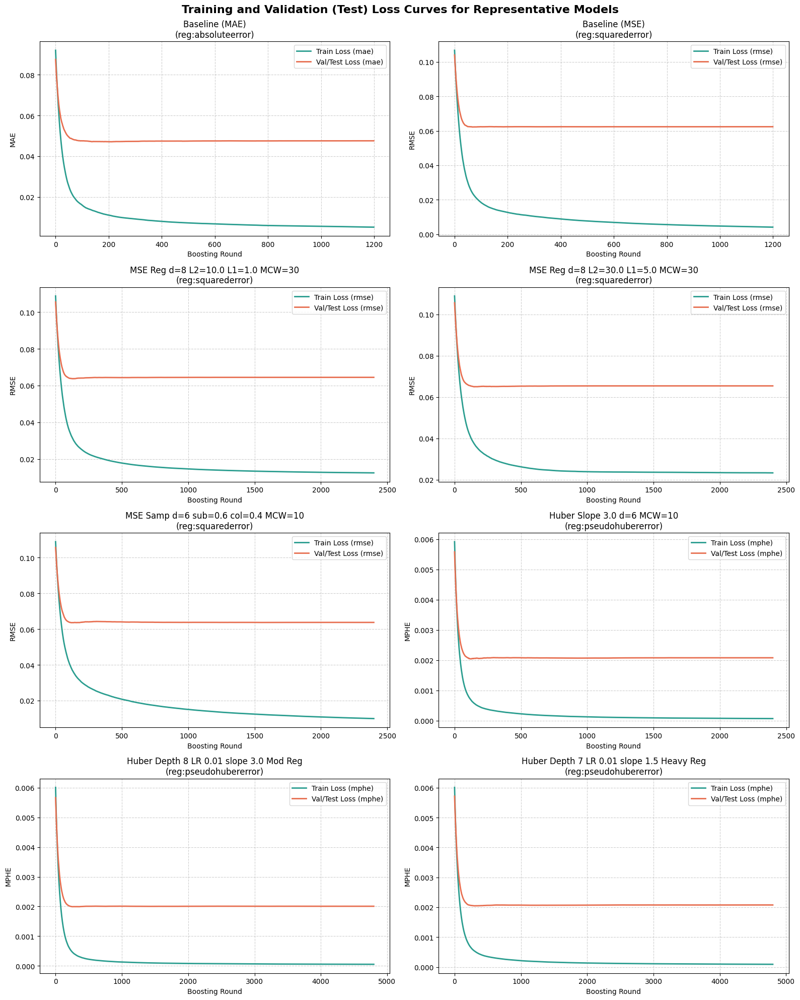

In [5]:
# Plot training vs validation loss curves for 8 selected representative models (4 rows, 2 columns)
selected_loss_models = [0, 1, 16, 28, 42, 60, 75, 79]
fig, axes = plt.subplots(4, 2, figsize=(16, 20))
axes = axes.flatten()

for i, mid in enumerate(selected_loss_models):
    config = next(c for c in MODELS_CONFIG if c["id"] == mid)
    model_name = config["name"]
    evals = evals_results[mid]
    metric_key = list(evals["validation_0"].keys())[0]
    
    train_loss = evals["validation_0"][metric_key]
    val_loss = evals["validation_1"][metric_key]
    
    ax = axes[i]
    ax.plot(train_loss, label=f"Train Loss ({metric_key})", color="#2a9d8f", linewidth=2)
    ax.plot(val_loss, label=f"Val/Test Loss ({metric_key})", color="#e76f51", linewidth=2)
    ax.set_xlabel("Boosting Round")
    ax.set_ylabel(metric_key.upper())
    ax.set_title(f"{model_name}\n({config['objective']})")
    ax.grid(True, linestyle="--", alpha=0.6)
    ax.legend()

plt.suptitle("Training and Validation (Test) Loss Curves for Representative Models", fontsize=16, fontweight="bold", y=0.99)
plt.tight_layout()
plt.savefig(out_dir / "loss_curves.png", dpi=300)
plt.show()


# Section 5: Metric Evaluation & Timing Summary

In this section, we evaluate the overall performance of all 80 model configurations on the held-out test split. We compute key statistical metrics ($R^2$, RMSE, ubRMSE, Bias, MAE, Median Absolute Error, and Pearson correlation) along with the recorded training and inference times. The results are compiled into a unified comparison table and saved to `metrics_summary.csv`.


In [6]:
# Define compute_metrics utility
def compute_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    err = y_true - y_pred
    ae = np.abs(err)
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = root_mean_squared_error(y_true, y_pred)
    ubrmse = np.sqrt(np.mean(((y_true - np.mean(y_true)) - (y_pred - np.mean(y_pred))) ** 2))
    bias = np.mean(err)
    med_ae = np.median(ae)
    if np.std(y_true) == 0 or np.std(y_pred) == 0:
        pearson = float("nan")
    else:
        pearson = np.corrcoef(y_true, y_pred)[0, 1]
    return {
        "R2": r2, "RMSE": rmse, "ubRMSE": ubrmse, "Bias": bias, "MAE": mae, "Med|Err|": med_ae, "Pearson": pearson
    }

# Compile summary metrics
summary_records = []
for config in MODELS_CONFIG:
    model_id = config["id"]
    model_name = config["name"]
    preds = test_predictions_df[f"pred_{model_id}"]
    
    metrics = compute_metrics(y_test, preds)
    metrics["Configuration"] = model_name
    metrics["Train Time (s)"] = config["train_time_s"]
    metrics["Inference Time (s)"] = config["inference_time_s"]
    summary_records.append(metrics)

summary_df = pd.DataFrame(summary_records)
# Reorder columns
cols_order = ["Configuration", "R2", "RMSE", "ubRMSE", "Bias", "MAE", "Med|Err|", "Pearson", "Train Time (s)", "Inference Time (s)"]
summary_df = summary_df[cols_order]

summary_df.to_csv(out_dir / "metrics_summary.csv", index=False)
print("===== COMPARATIVE PERFORMANCE & TIMING SUMMARY =====")
print(summary_df.to_string(index=False, formatters={
    'R2': '{:,.4f}'.format,
    'RMSE': '{:,.4f}'.format,
    'ubRMSE': '{:,.4f}'.format,
    'Bias': '{:+,.4f}'.format,
    'MAE': '{:,.4f}'.format,
    'Med|Err|': '{:,.4f}'.format,
    'Pearson': '{:,.4f}'.format,
    'Train Time (s)': '{:,.2f}'.format,
    'Inference Time (s)': '{:,.4f}'.format
}))

===== COMPARATIVE PERFORMANCE & TIMING SUMMARY =====
                            Configuration     R2   RMSE ubRMSE    Bias    MAE Med|Err| Pearson Train Time (s) Inference Time (s)
                           Baseline (MAE) 0.6452 0.0627 0.0590 -0.0214 0.0476   0.0365  0.8315           9.68             0.0844
                           Baseline (MSE) 0.6491 0.0624 0.0588 -0.0209 0.0469   0.0354  0.8339           8.06             0.0864
          MSE Reg d=8 L2=3.0 L1=0.1 MCW=2 0.6482 0.0625 0.0588 -0.0211 0.0469   0.0361  0.8331          15.80             0.1645
         MSE Reg d=8 L2=3.0 L1=0.1 MCW=10 0.6494 0.0623 0.0589 -0.0204 0.0468   0.0357  0.8331          16.03             0.1467
         MSE Reg d=8 L2=3.0 L1=0.1 MCW=30 0.6461 0.0626 0.0594 -0.0199 0.0469   0.0356  0.8311          14.99             0.1590
          MSE Reg d=8 L2=3.0 L1=1.0 MCW=2 0.6285 0.0642 0.0602 -0.0222 0.0487   0.0378  0.8238          12.21             0.1767
         MSE Reg d=8 L2=3.0 L1=1.0 MCW=10 0.

# Section 6: Overall Residual Plots

This section generates a comprehensive grid comparison of residuals across all 80 configurations. Residuals are plotted as a function of the true soil moisture value (True vs. Residual) to diagnose structural underfitting (mean regression) and error distributions. The resulting figure is saved as `residuals_comparison.png`.


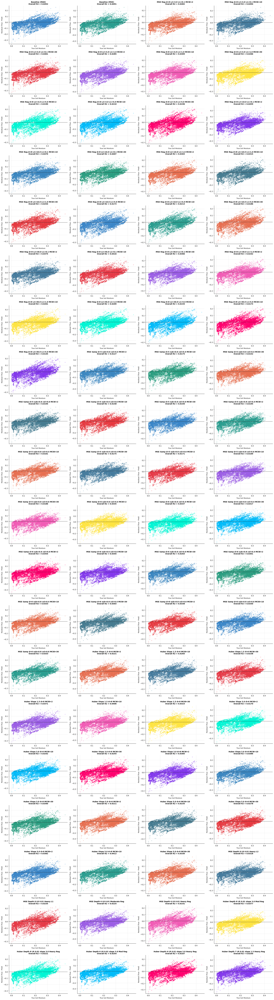

In [7]:
# Plot residuals comparison (20 rows, 4 columns = 80 axes)
fig, axes = plt.subplots(20, 4, figsize=(22, 80))
axes = axes.flatten()

# Curate some distinct colors for the plots
colors_palette = [
    '#3a86c8', '#2a9d8f', '#e76f51', '#457b9d', '#e63946', '#9b5de5', '#f15bb5', '#fee440', '#00f5d4',
    '#00bbf9', '#ff006e', '#8338ec', '#3a86c0', '#2a9d80', '#e76f50', '#457b90', '#e63940'
]

for i, config in enumerate(MODELS_CONFIG):
    model_id = config["id"]
    model_name = config["name"]
    preds = test_predictions_df[f"pred_{model_id}"]
    res = y_test - preds
    r2_val = r2_score(y_test, preds)
    
    ax = axes[i]
    ax.scatter(y_test, res, s=6, alpha=0.4, color=colors_palette[i % len(colors_palette)])
    ax.axhline(0, color='black', linestyle='--', linewidth=1.2, alpha=0.8)
    ax.set_xlabel("True Soil Moisture", fontsize=9)
    ax.set_ylabel("Residual (True - Pred)", fontsize=9)
    ax.set_title(f"{model_name}\nOverall R2 = {r2_val:.4f}", fontsize=10, fontweight='bold')
    ax.grid(alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Hide any remaining unused subplots (if any)
for j in range(len(MODELS_CONFIG), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig(out_dir / "residuals_comparison.png", dpi=150)
plt.show()


# Section 7: Year-by-Year Performance Evaluation & Residuals

In this section, we evaluate each of the 80 configurations separately on each test year (2023, 2024, and 2025) to understand their temporal generalization consistency. We calculate yearly performance metrics and compile them into `metrics_by_year.csv`. To keep the visualization manageable and save memory, we select a representative subset of 7 configurations (representing the baselines and each sweep group) to plot the residuals by year in a 7x3 grid saved as `residuals_by_year.png`.


Test years identified: [np.float64(2023.0), np.float64(2024.0), np.float64(2025.0)]



===== YEAR 2023 BASELINES & SAMPLE PERFORMANCES =====
 Year                           Configuration     R2   RMSE ubRMSE    Bias    MAE Med|Err| Pearson
 2023                          Baseline (MAE) 0.6287 0.0656 0.0568 -0.0328 0.0509   0.0407  0.8509
 2023                          Baseline (MSE) 0.6422 0.0644 0.0565 -0.0308 0.0503   0.0406  0.8530
 2023       MSE Reg d=8 L2=10.0 L1=1.0 MCW=30 0.6233 0.0660 0.0583 -0.0309 0.0519   0.0425  0.8431
 2023 Huber Depth 8 LR 0.01 slope 3.0 Mod Reg 0.6162 0.0667 0.0579 -0.0330 0.0517   0.0427  0.8445

===== YEAR 2024 BASELINES & SAMPLE PERFORMANCES =====
 Year                           Configuration     R2   RMSE ubRMSE    Bias    MAE Med|Err| Pearson
 2024                          Baseline (MAE) 0.6424 0.0597 0.0572 -0.0172 0.0445   0.0348  0.8301
 2024                          Baseline (MSE) 0.6391 0.0600 0.0568 -0.0191 0.0442   0.0338  0.8314
 2024       MSE Reg d=8 L2=10.0 L1=1.0 MCW=30 0.6226 0.0613 0.0578 -0.0204 0.0448   0.0333  0.8272

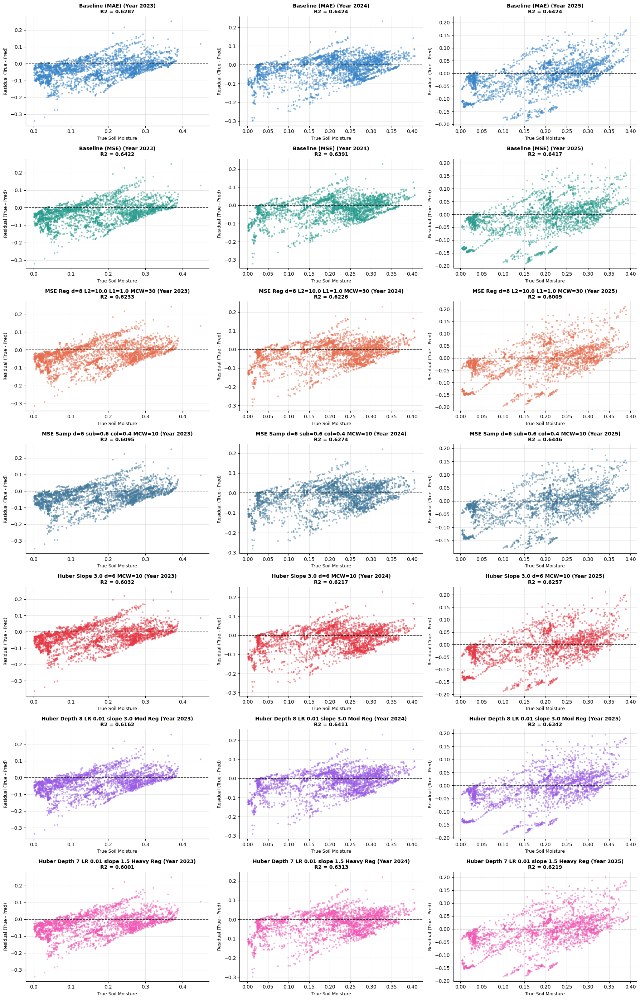

In [8]:
# Identify unique test years
test_years = sorted(test_predictions_df["year"].unique())
print(f"Test years identified: {test_years}")

yearly_records = []

for yr in test_years:
    df_yr = test_df[test_df["year"] == yr].reset_index(drop=True)
    y_test_yr = np.asarray(df_yr[TARGET_COL]).ravel()
    
    for config in MODELS_CONFIG:
        model_id = config["id"]
        model_name = config["name"]
        preds_yr = test_predictions_df[test_predictions_df["year"] == yr][f"pred_{model_id}"].values
        
        metrics_yr = compute_metrics(y_test_yr, preds_yr)
        metrics_yr["Year"] = int(yr)
        metrics_yr["Configuration"] = model_name
        yearly_records.append(metrics_yr)

yearly_summary_df = pd.DataFrame(yearly_records)
# Reorder columns
cols_order_yr = ["Year", "Configuration", "R2", "RMSE", "ubRMSE", "Bias", "MAE", "Med|Err|", "Pearson"]
yearly_summary_df = yearly_summary_df[cols_order_yr]

# Print yearly metrics breakdown for baseline models as a reference
for yr in test_years:
    print(f"\n===== YEAR {int(yr)} BASELINES & SAMPLE PERFORMANCES =====")
    df_yr_m = yearly_summary_df[(yearly_summary_df["Year"] == int(yr)) & (yearly_summary_df["Configuration"].isin([
        "Baseline (MAE)", "Baseline (MSE)", "MSE Reg d=8 L2=10.0 L1=1.0 MCW=30", "Huber Depth 8 LR 0.01 slope 3.0 Mod Reg"
    ]))]
    print(df_yr_m.to_string(index=False, formatters={
        'R2': '{:,.4f}'.format,
        'RMSE': '{:,.4f}'.format,
        'ubRMSE': '{:,.4f}'.format,
        'Bias': '{:+,.4f}'.format,
        'MAE': '{:,.4f}'.format,
        'Med|Err|': '{:,.4f}'.format,
        'Pearson': '{:,.4f}'.format
    }))

yearly_summary_df.to_csv(out_dir / "metrics_by_year.csv", index=False)

# Plot residuals by year for 7 selected representative models (7 rows, 3 columns = 21 axes)
selected_subset = [0, 1, 16, 42, 60, 75, 79] # MAE, MSE, Reg, Samp, Huber, LR Mod Reg, LR Heavy Reg
fig, axes = plt.subplots(len(selected_subset), 3, figsize=(18, 28))

# Curate colors matching the models
colors_palette = [
    '#3a86c8', '#2a9d8f', '#e76f51', '#457b9d', '#e63946', '#9b5de5', '#f15bb5'
]

for r_idx, model_id in enumerate(selected_subset):
    config = next(c for c in MODELS_CONFIG if c["id"] == model_id)
    model_name = config["name"]
    
    for col, yr in enumerate(test_years):
        df_yr = test_df[test_df["year"] == yr].reset_index(drop=True)
        y_test_yr = np.asarray(df_yr[TARGET_COL]).ravel()
        preds_yr = test_predictions_df[test_predictions_df["year"] == yr][f"pred_{model_id}"].values
        res_yr = y_test_yr - preds_yr
        r2_yr = r2_score(y_test_yr, preds_yr)
        
        ax = axes[r_idx, col]
        ax.scatter(y_test_yr, res_yr, s=6, alpha=0.4, color=colors_palette[r_idx % len(colors_palette)])
        ax.axhline(0, color='black', linestyle='--', linewidth=1.2, alpha=0.8)
        ax.set_xlabel("True Soil Moisture", fontsize=9)
        ax.set_ylabel("Residual (True - Pred)", fontsize=9)
        ax.set_title(f"{model_name} (Year {int(yr)})\nR2 = {r2_yr:.4f}", fontsize=10, fontweight='bold')
        ax.grid(alpha=0.3)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig(out_dir / "residuals_by_year.png", dpi=150)
plt.show()


# Section 8: Year-by-Year R2 Trend Visualization

To evaluate and compare all 78 new configurations alongside the two baselines, we organize them into 4 distinct plots matching their configuration groups:
1. **Group A**: MSE Regularization Grid (L1/L2 and MCW sweep at depth 8).
2. **Group B**: MSE Subsampling & Shallow Depths Sweep (subsample, colsample, and MCW sweep at depths 5 and 6).
3. **Group C**: Huber Loss & Regularization Sweep (Huber slopes, depths, and MCW sweep).
4. **Group D**: LR 0.01 & Heavy Regularization Sweep (fine learning rate 0.01 with estimators scaling and various regularization levels).

The baseline MAE and MSE are plotted on all charts as references. The R2 trends are visualized in a 2x2 layout saved as `r2_by_year.png`.


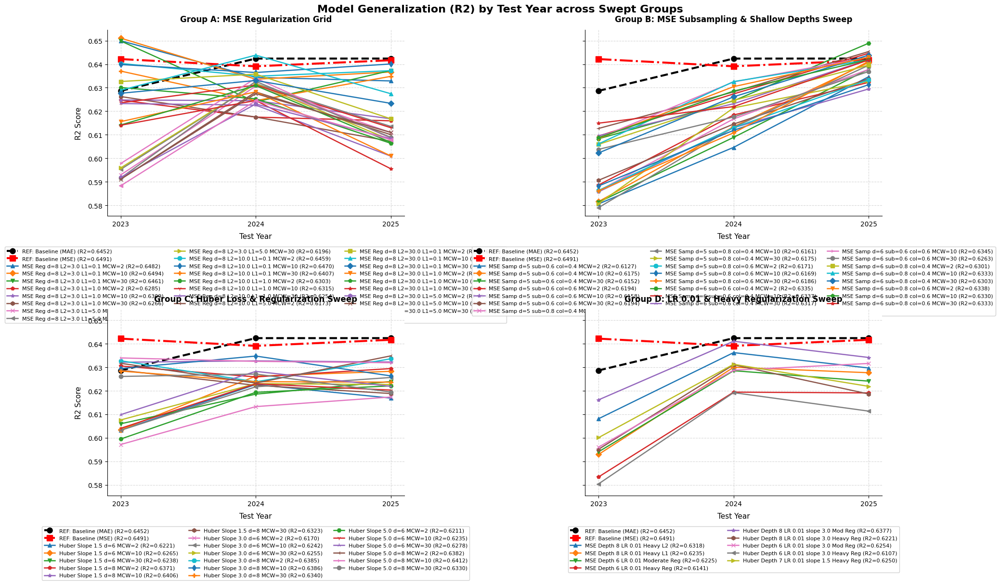

In [9]:
fig, axes = plt.subplots(2, 2, figsize=(20, 14), sharey=True)
axes = axes.flatten()

# Define groupings
group_A_ids = list(range(2, 29))
group_B_ids = list(range(29, 53))
group_C_ids = list(range(53, 71))
group_D_ids = list(range(71, 80))

groupings = [
    ("Group A: MSE Regularization Grid", group_A_ids, axes[0]),
    ("Group B: MSE Subsampling & Shallow Depths Sweep", group_B_ids, axes[1]),
    ("Group C: Huber Loss & Regularization Sweep", group_C_ids, axes[2]),
    ("Group D: LR 0.01 & Heavy Regularization Sweep", group_D_ids, axes[3])
]

# Set up unique markers
markers = ['o', 's', '^', 'D', 'v', 'p', '*', 'h', 'x', '<', '>', '8', 'd', 'P', 'H', '1', '2', '3', '4']

for r_idx, (title, ids, ax) in enumerate(groupings):
    # Always include Model 0 (MAE Baseline) and Model 1 (MSE Baseline) for reference
    reference_ids = [0, 1] + ids
    
    for idx, model_id in enumerate(reference_ids):
        config = next(c for c in MODELS_CONFIG if c["id"] == model_id)
        model_name = config["name"]
        
        # Retrieve yearly performance
        df_model = yearly_summary_df[yearly_summary_df["Configuration"] == model_name].sort_values("Year")
        years = df_model["Year"].values
        r2_vals = df_model["R2"].values
        
        # Retrieve overall R2 for the legend
        overall_r2 = summary_df[summary_df["Configuration"] == model_name]["R2"].values[0]
        
        # Format baseline models differently to stand out
        if model_id == 0:
            ax.plot(years, r2_vals, marker='o', markersize=8, linewidth=3.0, linestyle='--', color='black',
                    label=f"REF: Baseline (MAE) (R2={overall_r2:.4f})")
        elif model_id == 1:
            ax.plot(years, r2_vals, marker='s', markersize=8, linewidth=3.0, linestyle='-.', color='red',
                    label=f"REF: Baseline (MSE) (R2={overall_r2:.4f})")
        else:
            ax.plot(years, r2_vals, marker=markers[idx % len(markers)], markersize=6, linewidth=1.8,
                    label=f"{model_name} (R2={overall_r2:.4f})")
        
    ax.set_xticks(test_years)
    ax.set_xticklabels([str(int(y)) for y in test_years])
    ax.set_xlabel("Test Year", fontsize=11, labelpad=8)
    ax.set_title(title, fontsize=12, fontweight='bold', pad=12)
    ax.grid(True, linestyle='--', alpha=0.5)
    
    # Position legends dynamically depending on the group size to avoid clutter
    ncol_leg = 3 if len(ids) > 15 else (2 if len(ids) > 8 else 1)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=ncol_leg, 
              frameon=True, facecolor='white', framealpha=0.9, fontsize=8)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].set_ylabel("R2 Score", fontsize=11, labelpad=8)
axes[2].set_ylabel("R2 Score", fontsize=11, labelpad=8)

plt.suptitle("Model Generalization (R2) by Test Year across Swept Groups", fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.subplots_adjust(bottom=0.25, hspace=0.5)
plt.savefig(out_dir / "r2_by_year.png", dpi=300)
plt.show()
